**This notebook presents the computational analysis for "Creating and Analyzing a Dictionary-Based Lexical Resource for Somali Homograph Disambiguation" by Abdullahi Mohamed Jibril and Abdisalam Mahamed Badel, published in Springer's Artificial Intelligence and Speech Technology series (2025). The analysis includes statistical distributions, semantic similarity measurements, and machine learning clustering of 1,592 unique Somali homographs extracted from the Qaamuuska Af-Soomaaliga dictionary.**


In [34]:
# Enable matplotlib inline plotting in Colab
%matplotlib inline

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, classification_report, silhouette_score, calinski_harabasz_score, davies_bouldin_score
from google.colab import files
import io
import numpy as np
from sklearn.cluster import KMeans
from sentence_transformers import SentenceTransformer
from sklearn.manifold import TSNE
import os

In [ ]:
!pip install sentence-transformers

In [ ]:

df = pd.read_csv('/content/somali_homographs.csv')
print(df.head())
print(df.info())

  Somali_homograph  Meaning_Index  \
0             baad              1   
1             baad              2   
2             baad              3   
3             baad              4   
4             baad              5   

                                   Somali_definition  
0          Hanti qof ama dadkii laga adkaado baxsho.  
1                     Hadiyad la siiyo qof madax ah.  
2       Qof laga adag yahay hanti khasab uga qaadid.  
3  Caws, caleen, xaab iwm oo ay xooluhu daaqaan; ...  
4  Mid ka mid ah labada garab ee haadda ama dayuu...  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4809 entries, 0 to 4808
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Somali_homograph   4809 non-null   object
 1   Meaning_Index      4809 non-null   int64 
 2   Somali_definition  4809 non-null   object
dtypes: int64(1), object(2)
memory usage: 112.8+ KB
None


In [32]:
from matplotlib import pyplot as plt
import seaborn as sns

somali_alphabet = ['a', 'b', 't', 'j', 'x', 'kh', 'd', 'r', 's', 'sh', 'dh', 'c', 'g', 'f', 'q', 'k', 'l', 'm', 'n', 'w', 'h', 'y', 'e', 'i', 'o', 'u']

# Create a color palette for the Somali alphabet
color_palette = sns.color_palette("husl", len(somali_alphabet))
color_dict = dict(zip(somali_alphabet, color_palette))

def get_somali_first_letter(word):
    """Function to get the first letter or digraph of a Somali word"""
    if len(word) > 1 and word[:2].lower() in ['kh', 'sh', 'dh']:
        return word[:2].lower()
    return word[0].lower()

def save_and_display_plot(fig, filename):
    # Save as JPG with DPI=600
    fig.savefig(filename, format='jpg', dpi=600, bbox_inches='tight')

    # Display in notebook
    plt.show()

    # Download file
    files.download(filename)


In [15]:
def homograph_statistics(df):
    total_homographs = df['Somali_homograph'].nunique()
    total_meanings = df['Meaning_Index'].max()
    avg_meanings = df.groupby('Somali_homograph').size().mean()
    max_meanings = df.groupby('Somali_homograph').size().max()

    print(f"Total unique homographs: {total_homographs}")
    print(f"Total meanings across all homographs: {total_meanings}")
    print(f"Average meanings per homograph: {avg_meanings:.2f}")
    print(f"Maximum meanings for a single homograph: {max_meanings}")

homograph_statistics(df)

Total unique homographs: 1592
Total meanings across all homographs: 13
Average meanings per homograph: 3.02
Maximum meanings for a single homograph: 13


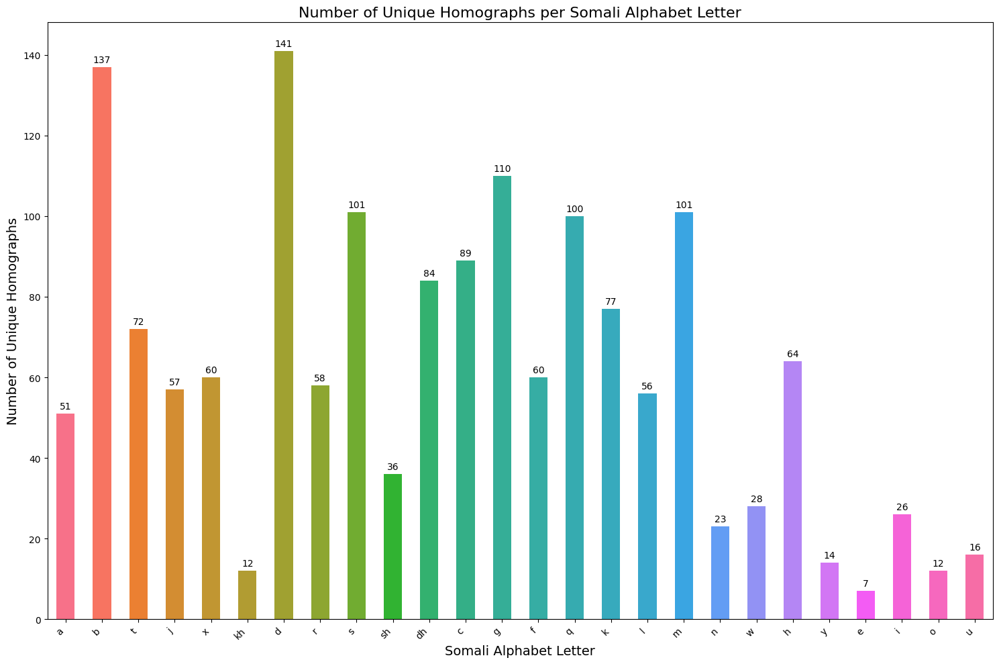

Top 5 letters with the most unique homographs:
First_Letter
d    141
b    137
g    110
s    101
m    101
Name: Somali_homograph, dtype: int64


In [16]:
def homographs_per_alphabet(df):
    # Ensure the directory exists
    os.makedirs('/content/Plots', exist_ok=True)

    df['First_Letter'] = df['Somali_homograph'].apply(get_somali_first_letter)
    unique_homographs = df.groupby('First_Letter')['Somali_homograph'].nunique().reindex(somali_alphabet, fill_value=0)

    fig, ax = plt.subplots(figsize=(15, 10))
    bars = unique_homographs.plot(kind='bar', color=[color_dict[letter] for letter in unique_homographs.index], ax=ax)
    ax.set_title('Number of Unique Homographs per Somali Alphabet Letter', fontsize=16)
    ax.set_xlabel('Somali Alphabet Letter', fontsize=14)
    ax.set_ylabel('Number of Unique Homographs', fontsize=14)
    plt.xticks(rotation=45, ha='right')

    for bar in bars.patches:
        ax.annotate(format(bar.get_height(), '.0f'),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='center',
                    size=10, xytext=(0, 8),
                    textcoords='offset points')

    plt.tight_layout()

    # Save the plot directly to the specified path with high DPI
    plt.savefig('/content/Plots/homographs_per_letter.jpg', dpi=600)

    # Optional: if you want to display and download
    plt.show()
    # files.download('/content/Plots/homographs_per_letter.jpg')

    print("Top 5 letters with the most unique homographs:")
    print(unique_homographs.sort_values(ascending=False).head())

# Call the function
homographs_per_alphabet(df)

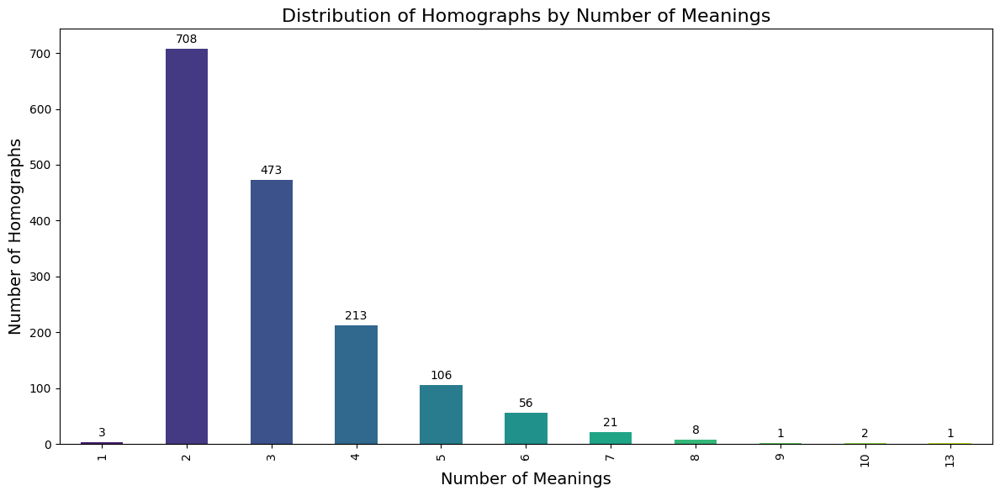

Distribution of homographs by number of meanings:
1       3
2     708
3     473
4     213
5     106
6      56
7      21
8       8
9       1
10      2
13      1
Name: count, dtype: int64


In [17]:
def meaning_index_distribution(df):
    # Ensure the directory exists
    os.makedirs('/content/Plots', exist_ok=True)

    meaning_counts = df.groupby('Somali_homograph').size().value_counts().sort_index()

    fig, ax = plt.subplots(figsize=(12, 6))
    bars = meaning_counts.plot(kind='bar', color=sns.color_palette("viridis", len(meaning_counts)), ax=ax)
    ax.set_title('Distribution of Homographs by Number of Meanings', fontsize=16)
    ax.set_xlabel('Number of Meanings', fontsize=14)
    ax.set_ylabel('Number of Homographs', fontsize=14)

    for bar in bars.patches:
        ax.annotate(format(bar.get_height(), '.0f'),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='center',
                    size=10, xytext=(0, 8),
                    textcoords='offset points')

    plt.tight_layout()

    # Save directly to /content/Plots with high DPI
    plt.savefig('/content/Plots/meaning_distribution.jpg', dpi=600, bbox_inches='tight')

    # Display the plot
    plt.show()
    # Optional: files.download('/content/Plots/meaning_distribution.jpg')

    print("Distribution of homographs by number of meanings:")
    print(meaning_counts)

# Call the function
meaning_index_distribution(df)

In [18]:
def average_meanings(df):
    avg_meanings = df.groupby('Somali_homograph').size().mean()
    print(f"On average, a Somali homograph has {avg_meanings:.2f} different meanings.")

average_meanings(df)

On average, a Somali homograph has 3.02 different meanings.


In [19]:
def most_ambiguous_per_letter(df):
    df['First_Letter'] = df['Somali_homograph'].apply(get_somali_first_letter)
    most_ambiguous = df.groupby('First_Letter').apply(lambda x: x.loc[x.groupby('Somali_homograph')['Meaning_Index'].transform('max').idxmax()])

    print("Most ambiguous homograph for each letter:")
    for _, row in most_ambiguous.iterrows():
        print(f"{row['First_Letter']}: {row['Somali_homograph']} ({row['Meaning_Index']} meanings)")

most_ambiguous_per_letter(df)

Most ambiguous homograph for each letter:
a: aad (1 meanings)
b: biir (1 meanings)
c: cas (1 meanings)
d: daar (1 meanings)
dh: dheg (1 meanings)
e: eri (1 meanings)
f: fiiq (1 meanings)
g: gal (1 meanings)
h: handad (1 meanings)
i: in (1 meanings)
j: jaf (1 meanings)
k: kar (1 meanings)
kh: khafiif (1 meanings)
l: laasin (1 meanings)
m: marso (1 meanings)
n: naajax (1 meanings)
o: oodan (1 meanings)
q: qaad (1 meanings)
r: reeb (1 meanings)
s: sin (1 meanings)
sh: shiil (1 meanings)
t: tag (1 meanings)
u: ur (1 meanings)
w: wareeg (1 meanings)
x: xaab (1 meanings)
y: yaab (1 meanings)


<ipython-input-19-2387049983>:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  most_ambiguous = df.groupby('First_Letter').apply(lambda x: x.loc[x.groupby('Somali_homograph')['Meaning_Index'].transform('max').idxmax()])


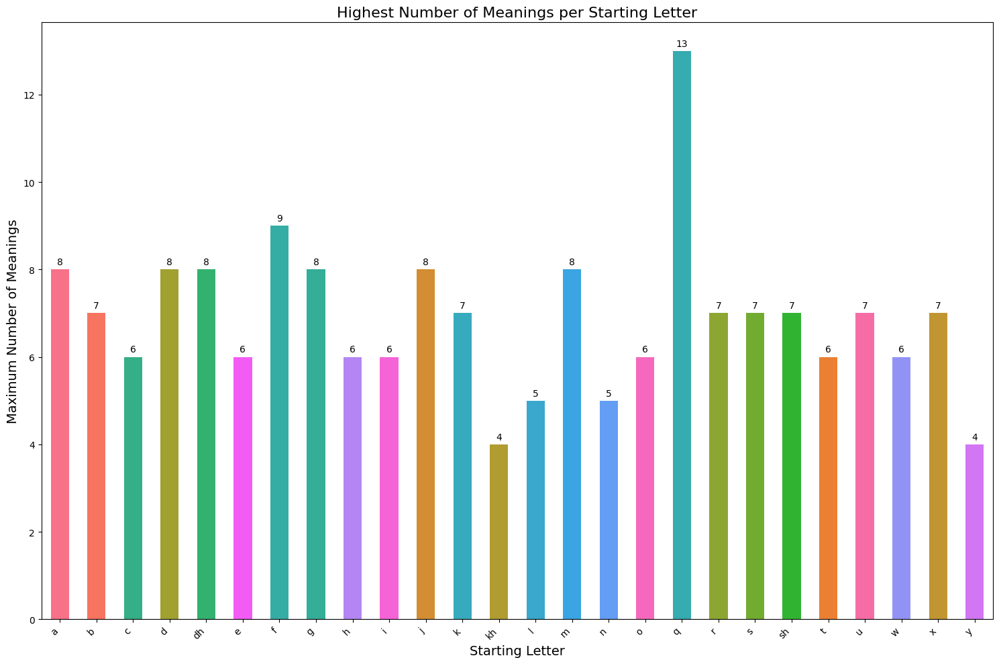

Homograph with the highest number of meanings for each starting letter:
First_Letter
a      8
b      7
c      6
d      8
dh     8
e      6
f      9
g      8
h      6
i      6
j      8
k      7
kh     4
l      5
m      8
n      5
o      6
q     13
r      7
s      7
sh     7
t      6
u      7
w      6
x      7
y      4
Name: Meaning_Index, dtype: int64


In [20]:
def max_meanings_per_letter(df):
    # Ensure the directory exists
    os.makedirs('/content/Plots', exist_ok=True)

    df['First_Letter'] = df['Somali_homograph'].apply(get_somali_first_letter)
    max_meanings = df.groupby(['First_Letter', 'Somali_homograph'])['Meaning_Index'].max().groupby('First_Letter').max()

    fig, ax = plt.subplots(figsize=(15, 10))
    bars = max_meanings.plot(kind='bar', color=[color_dict[letter] for letter in max_meanings.index], ax=ax)
    ax.set_title('Highest Number of Meanings per Starting Letter', fontsize=16)
    ax.set_xlabel('Starting Letter', fontsize=14)
    ax.set_ylabel('Maximum Number of Meanings', fontsize=14)
    plt.xticks(rotation=45, ha='right')

    for bar in bars.patches:
        ax.annotate(format(bar.get_height(), '.0f'),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='center',
                    size=10, xytext=(0, 8),
                    textcoords='offset points')

    plt.tight_layout()

    # Save directly to /content/Plots with high DPI
    plt.savefig('/content/Plots/max_meanings_per_letter.jpg', dpi=600, bbox_inches='tight')

    # Display the plot
    plt.show()
    # Optional: files.download('/content/Plots/max_meanings_per_letter.jpg')

    print("Homograph with the highest number of meanings for each starting letter:")
    print(max_meanings)

# Call the function
max_meanings_per_letter(df)

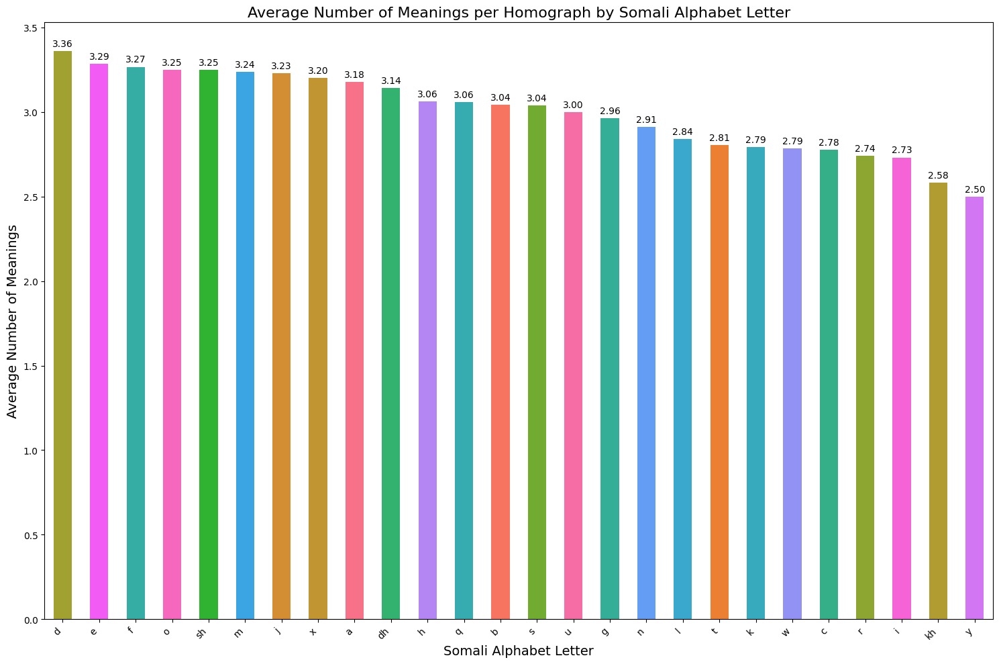

Top 5 letters with the highest average number of meanings per homograph:
First_Letter
d     3.361702
e     3.285714
f     3.266667
o     3.250000
sh    3.250000
Name: Meaning_Index, dtype: float64


In [21]:
def avg_meanings_per_letter(df):
    # Ensure the directory exists
    os.makedirs('/content/Plots', exist_ok=True)

    df['First_Letter'] = df['Somali_homograph'].apply(get_somali_first_letter)
    avg_meanings = df.groupby(['First_Letter', 'Somali_homograph'])['Meaning_Index'].max().groupby('First_Letter').mean().sort_values(ascending=False)

    fig, ax = plt.subplots(figsize=(15, 10))
    bars = avg_meanings.plot(kind='bar', color=[color_dict[letter] for letter in avg_meanings.index], ax=ax)
    ax.set_title('Average Number of Meanings per Homograph by Somali Alphabet Letter', fontsize=16)
    ax.set_xlabel('Somali Alphabet Letter', fontsize=14)
    ax.set_ylabel('Average Number of Meanings', fontsize=14)
    plt.xticks(rotation=45, ha='right')

    for bar in bars.patches:
        ax.annotate(format(bar.get_height(), '.2f'),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='center',
                    size=10, xytext=(0, 8),
                    textcoords='offset points')

    plt.tight_layout()

    # Save directly to /content/Plots with high DPI
    plt.savefig('/content/Plots/avg_meanings_per_letter.jpg', dpi=600, bbox_inches='tight')

    # Display the plot
    plt.show()
    # Optional: files.download('/content/Plots/avg_meanings_per_letter.jpg')

    print("Top 5 letters with the highest average number of meanings per homograph:")
    print(avg_meanings.head())

# Call the function
avg_meanings_per_letter(df)

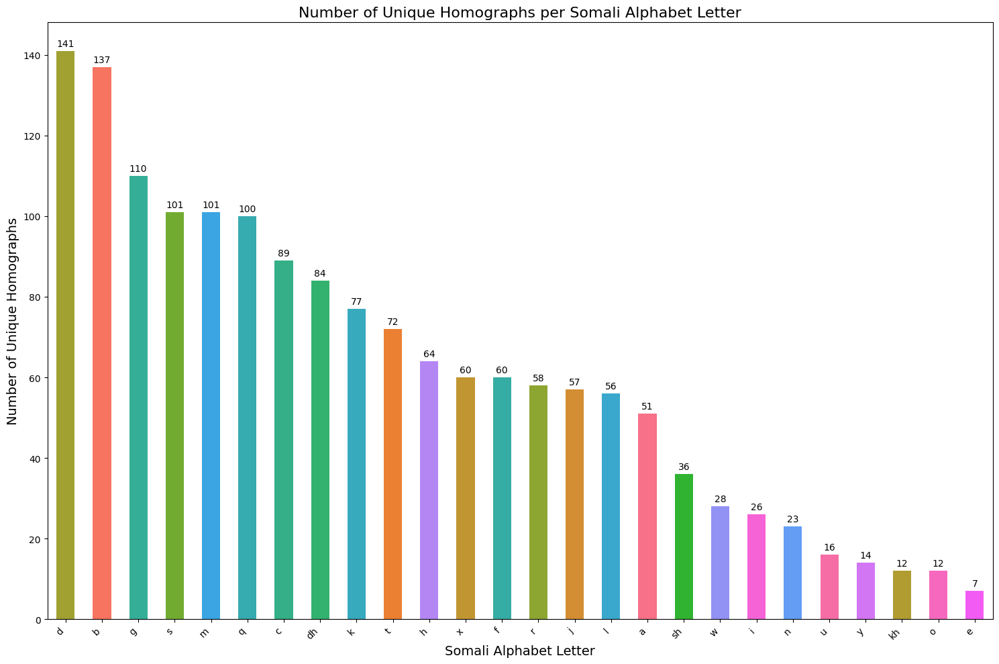

Number of unique homographs starting with each letter:
First_Letter
d     141
b     137
g     110
s     101
m     101
q     100
c      89
dh     84
k      77
t      72
h      64
x      60
f      60
r      58
j      57
l      56
a      51
sh     36
w      28
i      26
n      23
u      16
y      14
kh     12
o      12
e       7
Name: Somali_homograph, dtype: int64


In [22]:
def unique_homographs_per_letter(df):
    # Ensure the directory exists
    os.makedirs('/content/Plots', exist_ok=True)

    df['First_Letter'] = df['Somali_homograph'].apply(get_somali_first_letter)
    unique_counts = df.groupby('First_Letter')['Somali_homograph'].nunique().reindex(somali_alphabet, fill_value=0).sort_values(ascending=False)

    fig, ax = plt.subplots(figsize=(15, 10))
    bars = unique_counts.plot(kind='bar', color=[color_dict[letter] for letter in unique_counts.index], ax=ax)
    ax.set_title('Number of Unique Homographs per Somali Alphabet Letter', fontsize=16)
    ax.set_xlabel('Somali Alphabet Letter', fontsize=14)
    ax.set_ylabel('Number of Unique Homographs', fontsize=14)
    plt.xticks(rotation=45, ha='right')

    for bar in bars.patches:
        ax.annotate(format(bar.get_height(), '.0f'),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='center',
                    size=10, xytext=(0, 8),
                    textcoords='offset points')

    plt.tight_layout()

    # Save directly to /content/Plots with high DPI
    plt.savefig('/content/Plots/unique_homographs_per_letter.jpg', dpi=600, bbox_inches='tight')

    # Display the plot
    plt.show()
    # Optional: files.download('/content/Plots/unique_homographs_per_letter.jpg')

    print("Number of unique homographs starting with each letter:")
    print(unique_counts)

# Call the function
unique_homographs_per_letter(df)

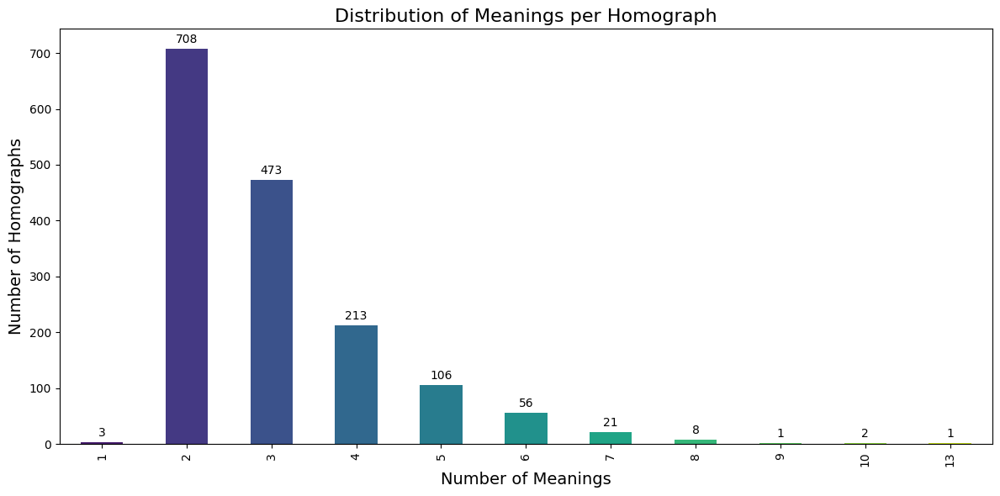

Distribution of meanings per homograph:
1       3
2     708
3     473
4     213
5     106
6      56
7      21
8       8
9       1
10      2
13      1
Name: count, dtype: int64


In [23]:
def frequency_analysis(df):
    # Ensure the directory exists
    os.makedirs('/content/Plots', exist_ok=True)

    homograph_counts = df.groupby('Somali_homograph').size().value_counts().sort_index()

    fig, ax = plt.subplots(figsize=(12, 6))
    bars = homograph_counts.plot(kind='bar', color=sns.color_palette("viridis", len(homograph_counts)), ax=ax)
    ax.set_title('Distribution of Meanings per Homograph', fontsize=16)
    ax.set_xlabel('Number of Meanings', fontsize=14)
    ax.set_ylabel('Number of Homographs', fontsize=14)

    for bar in bars.patches:
        ax.annotate(format(bar.get_height(), '.0f'),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='center',
                    size=10, xytext=(0, 8),
                    textcoords='offset points')

    plt.tight_layout()

    # Save directly to /content/Plots with high DPI
    plt.savefig('/content/Plots/meaning_frequency.jpg', dpi=600, bbox_inches='tight')

    # Display the plot
    plt.show()
    # Optional: files.download('/content/Plots/meaning_frequency.jpg')

    print("Distribution of meanings per homograph:")
    print(homograph_counts)

# Call the function
frequency_analysis(df)

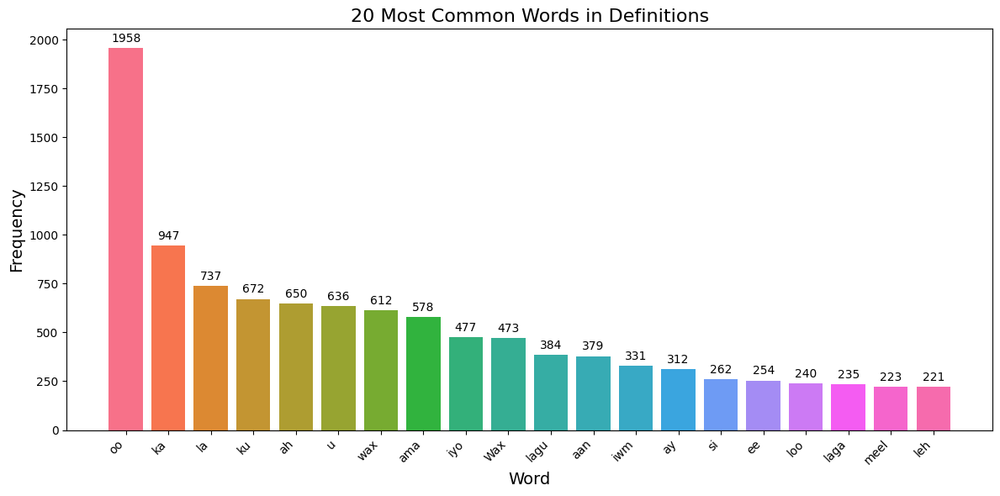

20 Most Common Words in Definitions:
oo: 1958
ka: 947
la: 737
ku: 672
ah: 650
u: 636
wax: 612
ama: 578
iyo: 477
Wax: 473
lagu: 384
aan: 379
iwm: 331
ay: 312
si: 262
ee: 254
loo: 240
laga: 235
meel: 223
leh: 221


In [24]:
def word_frequency_analysis(df):
    # Ensure the directory exists
    os.makedirs('/content/Plots', exist_ok=True)

    all_words = ' '.join(df['Somali_definition']).split()
    word_freq = Counter(all_words).most_common(20)

    fig, ax = plt.subplots(figsize=(12, 6))
    words, freqs = zip(*word_freq)
    bars = ax.bar(words, freqs, color=sns.color_palette("husl", 20))
    ax.set_title('20 Most Common Words in Definitions', fontsize=16)
    ax.set_xlabel('Word', fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)
    plt.xticks(rotation=45, ha='right')

    for bar in bars:
        ax.annotate(format(bar.get_height(), '.0f'),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='center',
                    size=10, xytext=(0, 8),
                    textcoords='offset points')

    plt.tight_layout()

    # Save directly to /content/Plots with high DPI
    plt.savefig('/content/Plots/common_words.jpg', dpi=600, bbox_inches='tight')

    # Display the plot
    plt.show()
    # Optional: files.download('/content/Plots/common_words.jpg')

    print("20 Most Common Words in Definitions:")
    for word, freq in word_freq:
        print(f"{word}: {freq}")

# Call the function
word_frequency_analysis(df)

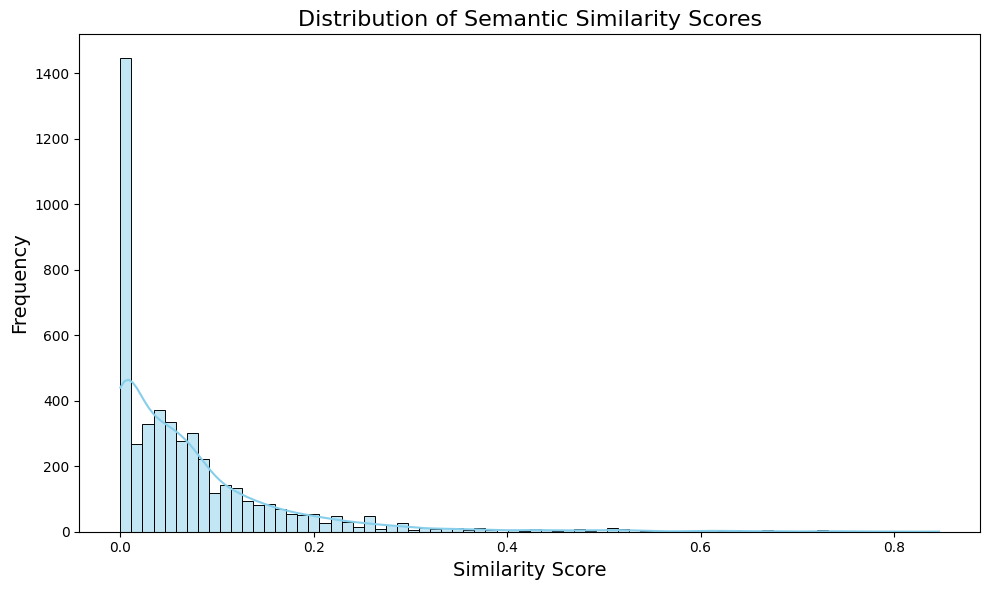

Average semantic similarity between definitions: 0.07
Homograph with highest semantic similarity: jaarri
Homograph with lowest semantic similarity: tabaashiir


In [25]:
def semantic_similarity_analysis(df):
    # Ensure the directory exists
    os.makedirs('/content/Plots', exist_ok=True)

    def calculate_meaning_similarities(definitions):
        vectorizer = TfidfVectorizer()
        tfidf_matrix = vectorizer.fit_transform(definitions)
        similarity_matrix = cosine_similarity(tfidf_matrix)
        n = similarity_matrix.shape[0]
        total_similarity = similarity_matrix.sum() - n  # Subtract self-similarities
        average_similarity = total_similarity / (n * (n - 1)) if n > 1 else 0
        return average_similarity

    df['Similarity_Score'] = df.groupby('Somali_homograph')['Somali_definition'].transform(
        lambda x: calculate_meaning_similarities(x) if len(x) > 1 else 0
    )

    fig, ax = plt.subplots(figsize=(10, 6))
    sns.histplot(df['Similarity_Score'], kde=True, color='skyblue', edgecolor='black', ax=ax)
    ax.set_title('Distribution of Semantic Similarity Scores', fontsize=16)
    ax.set_xlabel('Similarity Score', fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)
    plt.tight_layout()

    # Save directly to /content/Plots with high DPI
    plt.savefig('/content/Plots/semantic_similarity_distribution.jpg', dpi=600, bbox_inches='tight')

    # Display the plot
    plt.show()
    # Optional: files.download('/content/Plots/semantic_similarity_distribution.jpg')

    print(f"Average semantic similarity between definitions: {df['Similarity_Score'].mean():.2f}")
    print(f"Homograph with highest semantic similarity: {df.loc[df['Similarity_Score'].idxmax(), 'Somali_homograph']}")
    print(f"Homograph with lowest semantic similarity: {df.loc[df['Similarity_Score'].idxmin(), 'Somali_homograph']}")

# Call the function
semantic_similarity_analysis(df)

In [26]:

def save_and_display_plot(fig, filename):
    # Save as JPG with DPI=600
    fig.savefig(filename, format='jpg', dpi=600, bbox_inches='tight')
    # Display in notebook
    plt.show()
    # Download file
    files.download(filename)

# Set the style using seaborn directly to avoid deprecation warning
sns.set_style("whitegrid")

# Calculate average length of each Somali homograph
df['homograph_length'] = df['Somali_homograph'].str.len()
avg_length = df.groupby('Somali_homograph')['homograph_length'].mean().reset_index()

average_length = avg_length['homograph_length'].mean()
print(f"Average length of Somali homographs: {average_length:.2f}")

# Calculate longest and shortest homographs
longest_homograph = df.loc[df['homograph_length'].idxmax(), 'Somali_homograph']
longest_length = df['homograph_length'].max()
shortest_homograph = df.loc[df['homograph_length'].idxmin(), 'Somali_homograph']
shortest_length = df['homograph_length'].min()

print(f"Longest homograph: '{longest_homograph}' with length {longest_length}")
print(f"Shortest homograph: '{shortest_homograph}' with length {shortest_length}")

Average length of Somali homographs: 5.51
Longest homograph: 'gaaddabbuur' with length 11
Shortest homograph: 'ci' with length 2


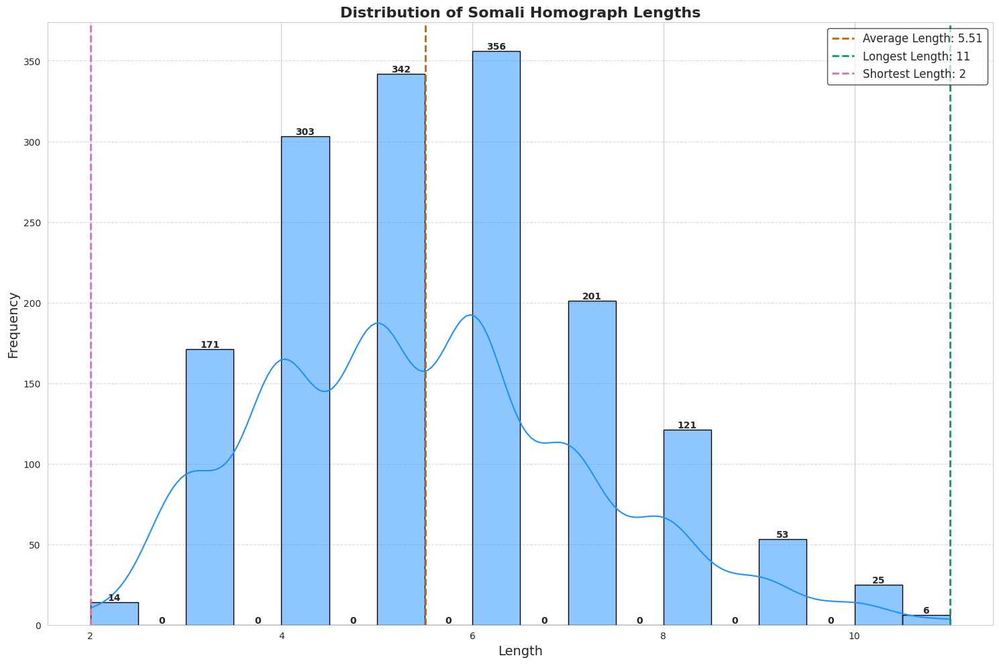

In [27]:
# Ensure the directory exists
os.makedirs('/content/Plots', exist_ok=True)

fig, ax = plt.subplots(figsize=(15, 10))

# Use a color-blind friendly and print-friendly color palette
bars = sns.histplot(avg_length['homograph_length'], kde=True,
                    color='#1E90FF',  # Dodger Blue - more print-friendly
                    edgecolor='black',
                    ax=ax)

ax.set_title('Distribution of Somali Homograph Lengths', fontsize=16, fontweight='bold')
ax.set_xlabel('Length', fontsize=14)
ax.set_ylabel('Frequency', fontsize=14)

# Improve bar label visibility
for i, bar in enumerate(ax.patches):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height(),
            f'{int(bar.get_height())}',
            ha='center', va='bottom', fontsize=10, fontweight='bold')

# Use color-blind friendly colors for vertical lines
ax.axvline(x=average_length, color='#D55E00', linestyle='--',
           linewidth=2, label=f'Average Length: {average_length:.2f}')
ax.axvline(x=longest_length, color='#009E73', linestyle='--',
           linewidth=2, label=f'Longest Length: {longest_length}')
ax.axvline(x=shortest_length, color='#CC79A7', linestyle='--',
           linewidth=2, label=f'Shortest Length: {shortest_length}')

# Improve legend readability
ax.legend(fontsize=12, frameon=True, edgecolor='black', facecolor='white',
          framealpha=0.7, loc='upper right')

# Enhance grid for better readability
ax.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()

# Save directly to /content/Plots with high DPI
plt.savefig('/content/Plots/homograph_length_distribution.jpg',
            dpi=600,
            bbox_inches='tight',
            facecolor='white',  # Ensure white background for print
            edgecolor='none')

# Display the plot
plt.show()


Cluster visualization saved as '/content/Plots/cluster_visualization.png'


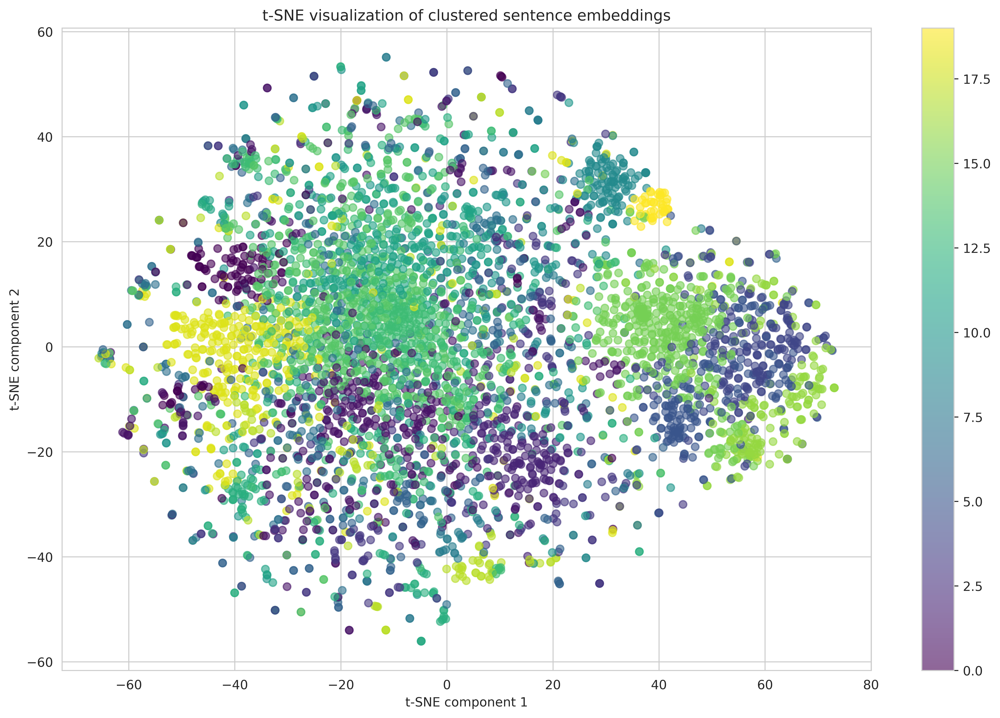


Cluster Analysis:

Cluster 0:
  Size: 125
  Top homographs: [('buuq', 2), ('taqtaq', 2), ('xaryan', 2)]
  Sample definitions:
    - Xoolo badan.
    - Bahal yar oo badarka gala oo cuna.
    - Biyo badan, dhanaan oo dhulka intiisa badan ku rogan; maanyo.

Cluster 1:
  Size: 395
  Top homographs: [('jal', 3), ('galaan', 3), ('qafaal', 3)]
  Sample definitions:
    - Olole dad dan gaar ah laga leeyahay oo khasab lagu dumo; qafaal.
    -  fardo aan la ilaalin oo banjoog ah.
    - Kalluun yaryar oo gudguduudan.

Cluster 2:
  Size: 183
  Top homographs: [('seegseeg', 3), ('fiiq', 3), ('boos', 2)]
  Sample definitions:
    - Qaarka hore ee xoolaha.
    - Qalab haweenku isku qurxin darteed ashadaan.
    -  qof qaawan.

Cluster 3:
  Size: 195
  Top homographs: [('fiix', 3), ('booc', 2), ('tiraab', 2)]
  Sample definitions:
    - Af wareegsan; wareeg.
    - Meel aadid.
    - Arrin si aad ah u lafagurid.

Cluster 4:
  Size: 190
  Top homographs: [('qaad', 3), ('kar', 3), ('beddel', 2)]
  Sample 

In [33]:
def encode_sentences(model, sentences):
    return model.encode(sentences)

def perform_clustering(embeddings, n_clusters):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    return kmeans.fit_predict(embeddings)

def visualize_clusters(embeddings, clusters, homographs):
    tsne = TSNE(n_components=2, random_state=42)
    reduced_embeddings = tsne.fit_transform(embeddings)

    plt.figure(figsize=(12, 8), dpi=600)
    scatter = plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1], c=clusters, cmap='viridis', alpha=0.6)
    plt.colorbar(scatter)
    plt.title("t-SNE visualization of clustered sentence embeddings")
    plt.xlabel("t-SNE component 1")
    plt.ylabel("t-SNE component 2")
    plt.tight_layout()

    # Save the high-resolution image to the specified Google Colab path
    plt.savefig("/content/Plots/cluster_visualization.png", dpi=600)
    print("\nCluster visualization saved as '/content/Plots/cluster_visualization.png'")

    # Optionally show the plot in the notebook
    plt.show()

def analyze_clusters(clusters, homographs, definitions):
    cluster_analysis = []
    for cluster in range(max(clusters) + 1):
        cluster_indices = np.where(clusters == cluster)[0]
        cluster_homographs = homographs.iloc[cluster_indices]
        cluster_definitions = definitions.iloc[cluster_indices]

        most_common = Counter(cluster_homographs).most_common(3)

        analysis = {
            "cluster": cluster,
            "size": len(cluster_indices),
            "top_homographs": most_common,
            "sample_definitions": cluster_definitions.sample(min(3, len(cluster_definitions))).tolist()
        }
        cluster_analysis.append(analysis)

    return cluster_analysis

# Main execution
# Assuming df is already loaded and available
# Load a pre-trained sentence transformer model
model = SentenceTransformer('paraphrase-MiniLM-L6-v2')

# Encode sentences
embeddings = encode_sentences(model, df['Somali_definition'].tolist())

# Perform clustering
n_clusters = min(20, df['Somali_homograph'].nunique())  # Choose a reasonable number of clusters
clusters = perform_clustering(embeddings, n_clusters)

# Visualize clusters
visualize_clusters(embeddings, clusters, df['Somali_homograph'])

# Analyze clusters
cluster_analysis = analyze_clusters(clusters, df['Somali_homograph'], df['Somali_definition'])

# Print cluster analysis
print("\nCluster Analysis:")
for analysis in cluster_analysis:
    print(f"\nCluster {analysis['cluster']}:")
    print(f"  Size: {analysis['size']}")
    print(f"  Top homographs: {analysis['top_homographs']}")
    print("  Sample definitions:")
    for definition in analysis['sample_definitions']:
        print(f"    - {definition}")

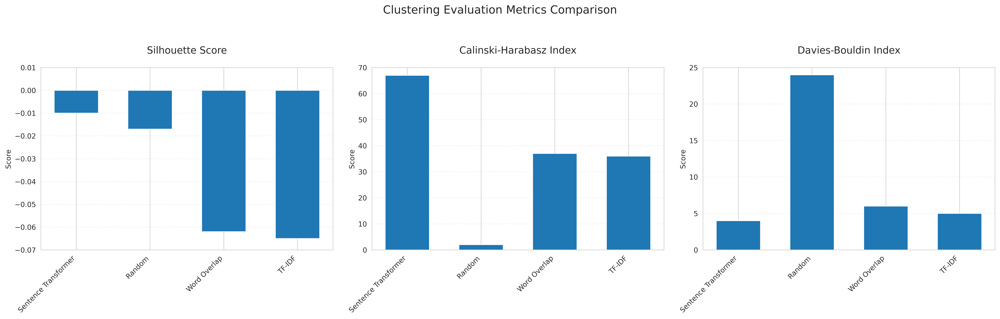

In [36]:
# Create directory if it doesn't exist
os.makedirs('/content/Plots', exist_ok=True)

# Sample data
methods = ['Sentence Transformer', 'Random', 'Word Overlap', 'TF-IDF']
silhouette_scores = [-0.01, -0.017, -0.062, -0.065]
calinski_scores = [67, 2, 37, 36]
davies_scores = [4, 24, 6, 5]

# Set figure size and create subplots with high DPI
plt.figure(figsize=(20, 6), dpi=600)

# Plot 1: Silhouette Score
plt.subplot(131)
plt.bar(methods, silhouette_scores, color='#1f77b4', width=0.6)
plt.title('Silhouette Score', pad=20, fontsize=14)
plt.ylabel('Score')
plt.grid(True, axis='y', linestyle='--', alpha=0.3)
plt.xticks(rotation=45, ha='right')
plt.ylim(-0.07, 0.01)

# Plot 2: Calinski-Harabasz Index
plt.subplot(132)
plt.bar(methods, calinski_scores, color='#1f77b4', width=0.6)
plt.title('Calinski-Harabasz Index', pad=20, fontsize=14)
plt.ylabel('Score')
plt.grid(True, axis='y', linestyle='--', alpha=0.3)
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 70)

# Plot 3: Davies-Bouldin Index
plt.subplot(133)
plt.bar(methods, davies_scores, color='#1f77b4', width=0.6)
plt.title('Davies-Bouldin Index', pad=20, fontsize=14)
plt.ylabel('Score')
plt.grid(True, axis='y', linestyle='--', alpha=0.3)
plt.xticks(rotation=45, ha='right')
plt.ylim(0, 25)

# Add main title
plt.suptitle('Clustering Evaluation Metrics Comparison', fontsize=16, y=1.05)

# Adjust layout
plt.tight_layout()

# Save the figure with high resolution
plt.savefig('/content/Plots/clustering_metrics_comparison.png',
            dpi=600,
            bbox_inches='tight',
            pad_inches=0.5)

plt.show()